# RAPIDS cuML TfidfVectorizer and KNN to find similar Text and Images with visualization using T-SNE
RAPIDS cuML's TfidfVectorizer and cuML's KNN are used to find items with similar titles and items with similar images. First, RAPIDS cuML TfidfVectorizer is used to extract text embeddings of each item's title and are compared among one another using RAPIDS cuML KNN. Next, image embeddings of each item are extracted with EffNetB0, which are then compared using RAPIDS cuML KNN. Additionally, the operation efficiency are compared between RAPIDS cuDF vs pandas and RAPIDS cuML with sklearn. Finally, visualization of the text embeddings are performed using cuML T-SNE. [](http://)

# Load Libraries

In [ ]:
# import the data
"""
import opendatasets as od

od.download(
    "https://www.kaggle.com/competitions/shopee-product-matching/data?select=train_images") """

'\nimport opendatasets as od \n  \nod.download( \n    "https://www.kaggle.com/competitions/shopee-product-matching/data?select=train_images") '

In [ ]:
import os
os.getcwd()

'/home/jinwoo/project/cudas'

In [ ]:
!nvcc test.cu -o test
!./test
!nvcc --version

Hello, CUDA!
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Tue_Oct_29_23:50:19_PDT_2024
Cuda compilation tools, release 12.6, V12.6.85
Build cuda_12.6.r12.6/compiler.35059454_0


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2, matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
print('TF',tf.__version__)

2024-12-12 04:05:57.111571: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-12 04:05:57.266881: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733994357.346579  117926 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733994357.363035  117926 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-12 04:05:57.503265: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

TF 2.18.0


In [ ]:
# RESTRICT TENSORFLOW TO 12GB OF GPU RAM
# SO THAT WE HAVE GPU RAM FOR RAPIDS CUML KNN
LIMIT = 12
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    tf.config.experimental.set_virtual_device_configuration(
        gpus[0],
        [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024*LIMIT)])
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    print(e)
print('Restrict TensorFlow to max %iGB GPU RAM'%LIMIT)
print('so RAPIDS can use %iGB GPU RAM'%(16-LIMIT))

1 Physical GPUs, 1 Logical GPUs
Restrict TensorFlow to max 12GB GPU RAM
so RAPIDS can use 4GB GPU RAM


I0000 00:00:1733994359.709474  117926 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 12288 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070 Ti, pci bus id: 0000:01:00.0, compute capability: 8.9


# Load Train Data
In this competition, we have items with an image and title. For the train data, the column `label_group` indicates the ground truth of which items are similar. We need to build a model that finds these similar images based on their image and title's text. In this notebook we explore some tools to help us.

In [ ]:
train = pd.read_csv('shopee-product-matching/train.csv')
print('train shape is', train.shape )
train.head()

train shape is (34250, 5)


,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


# Display Random Items from Train Data

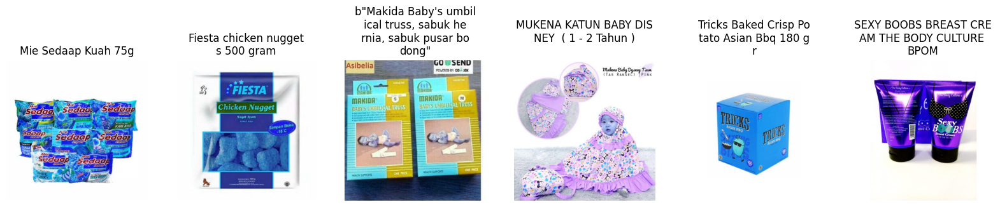

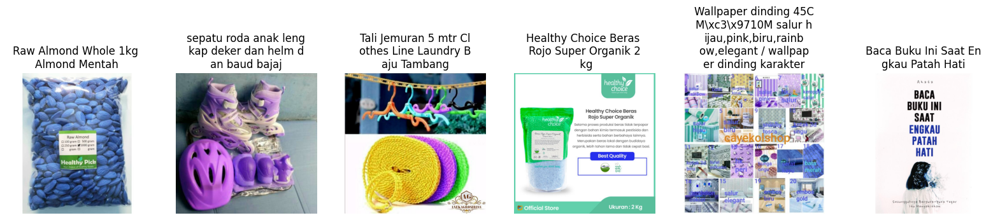

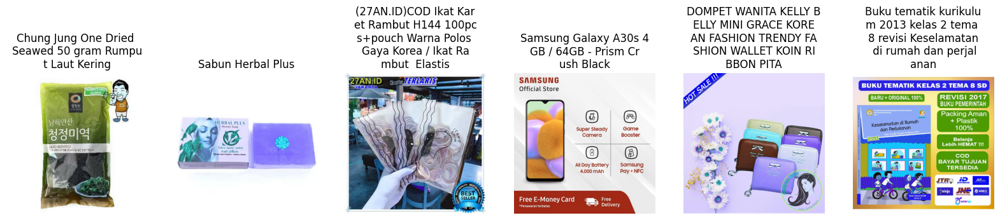

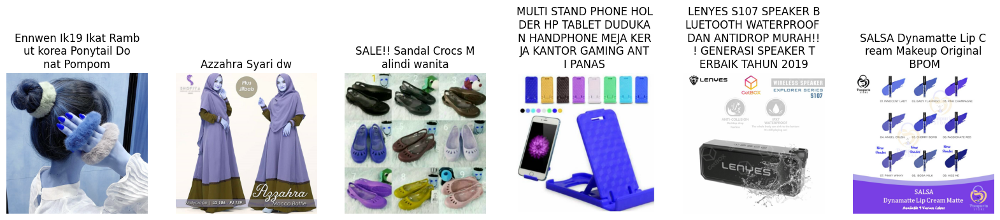

In [ ]:
BASE = 'shopee-product-matching/train_images/'

def displayDF(train, random=False, COLS=6, ROWS=4, path=BASE):
    for k in range(ROWS):
        plt.figure(figsize=(20,5))
        for j in range(COLS):
            if random: row = np.random.randint(0,len(train))
            else: row = COLS*k + j
            name = train.iloc[row,1]
            title = train.iloc[row,3]
            title_with_return = ""
            for i,ch in enumerate(title):
                title_with_return += ch
                if (i!=0)&(i%20==0): title_with_return += '\n'
            img = cv2.imread(path+name)
            plt.subplot(1,COLS,j+1)
            plt.title(title_with_return)
            plt.axis('off')
            plt.imshow(img)
        plt.show()

displayDF(train, random=True)

# Display Duplicated Items from Train Data
Using the column `label_group` which is the ground truth, we can display examples of duplicated items.

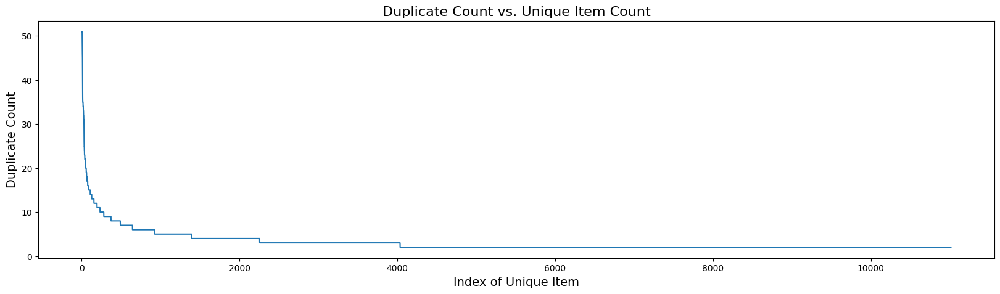

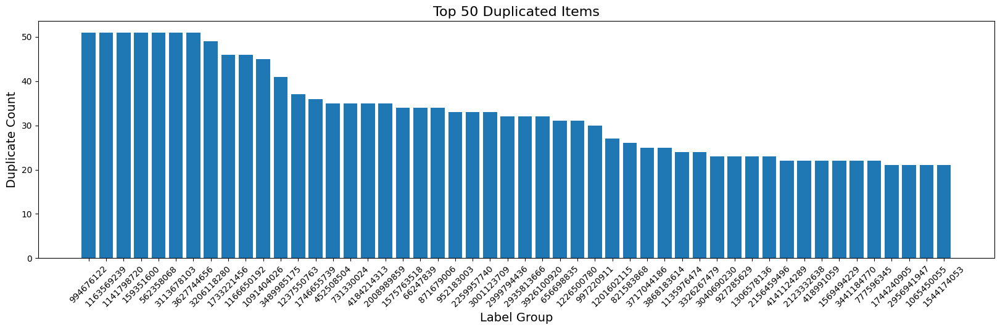

In [ ]:
groups = train.label_group.value_counts()
plt.figure(figsize=(20,5))
plt.plot(np.arange(len(groups)),groups.values)
plt.ylabel('Duplicate Count',size=14)
plt.xlabel('Index of Unique Item',size=14)
plt.title('Duplicate Count vs. Unique Item Count',size=16)
plt.show()

plt.figure(figsize=(20,5))
plt.bar(groups.index.values[:50].astype('str'),groups.values[:50])
plt.xticks(rotation = 45)
plt.ylabel('Duplicate Count',size=14)
plt.xlabel('Label Group',size=14)
plt.title('Top 50 Duplicated Items',size=16)
plt.show()

########################################
### TOP 1 DUPLICATED ITEM: 994676122
########################################


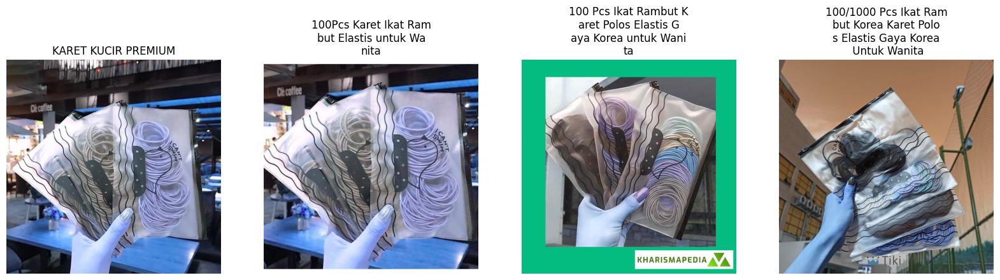

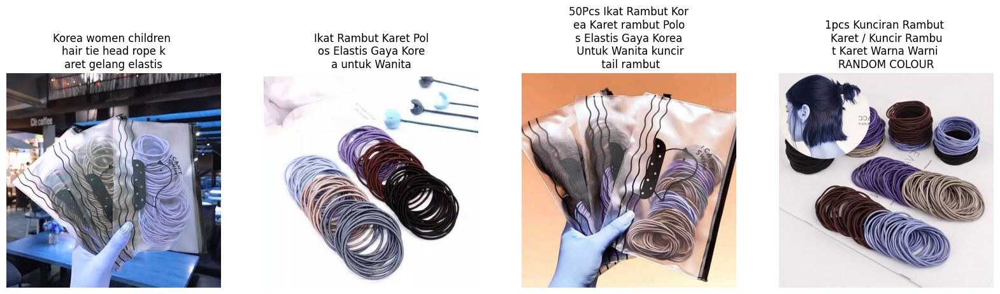

########################################
### TOP 2 DUPLICATED ITEM: 1163569239
########################################


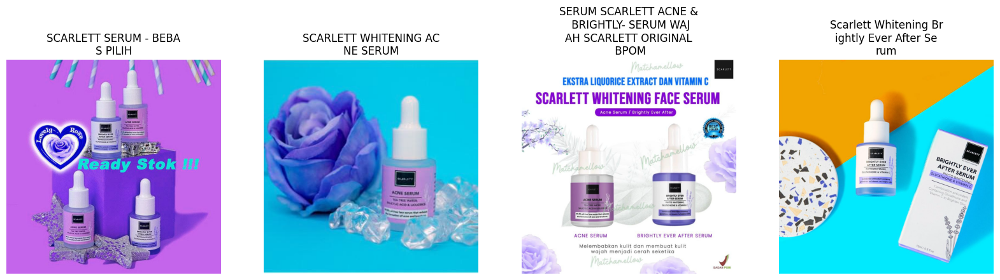

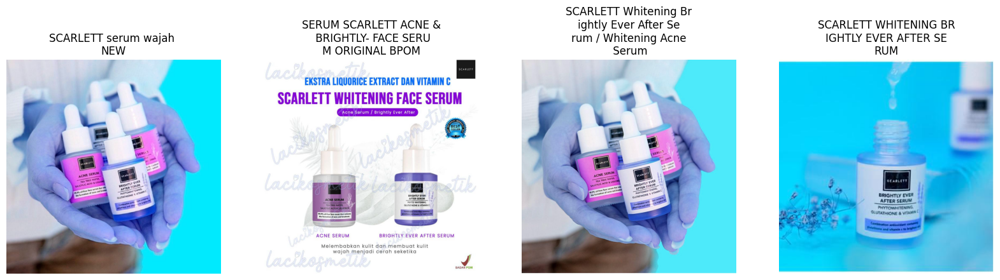

########################################
### TOP 3 DUPLICATED ITEM: 1141798720
########################################


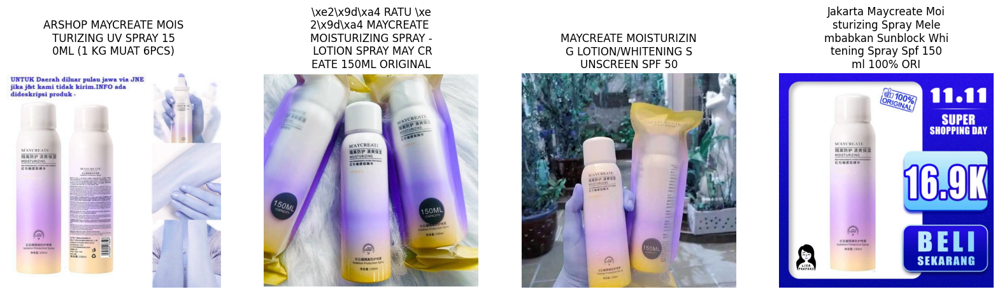

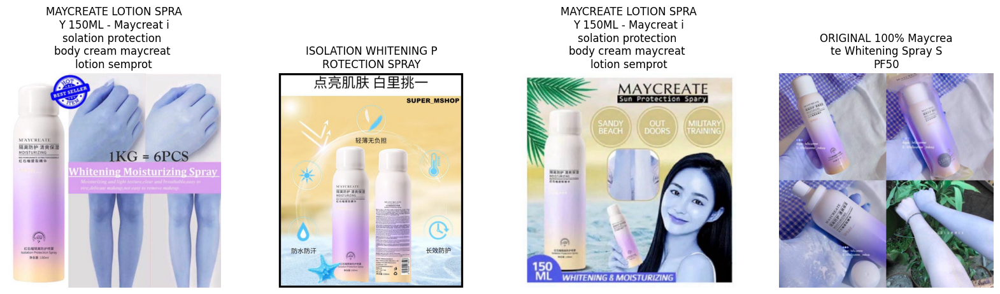

########################################
### TOP 4 DUPLICATED ITEM: 159351600
########################################


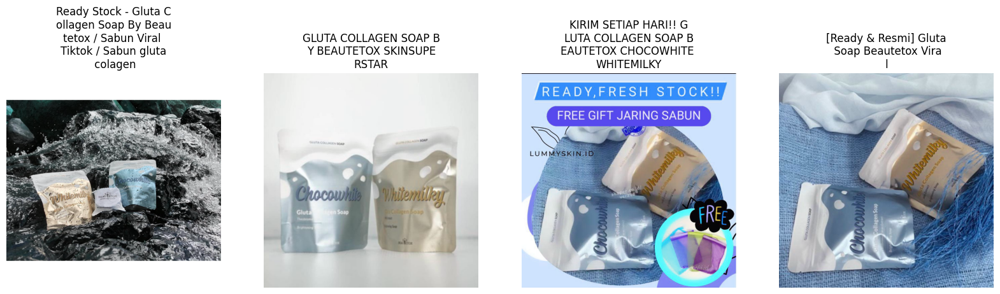

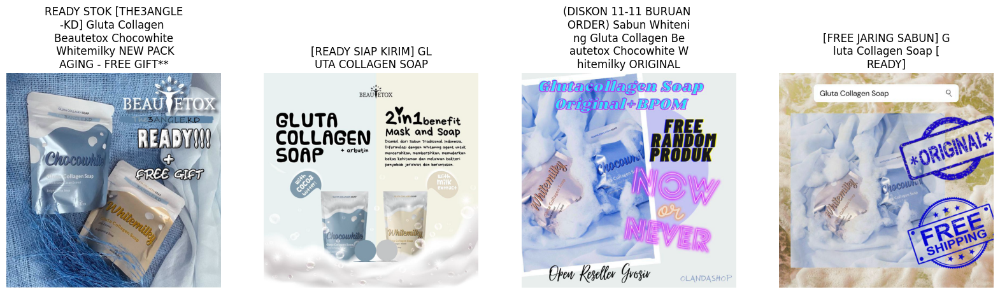

########################################
### TOP 5 DUPLICATED ITEM: 562358068
########################################


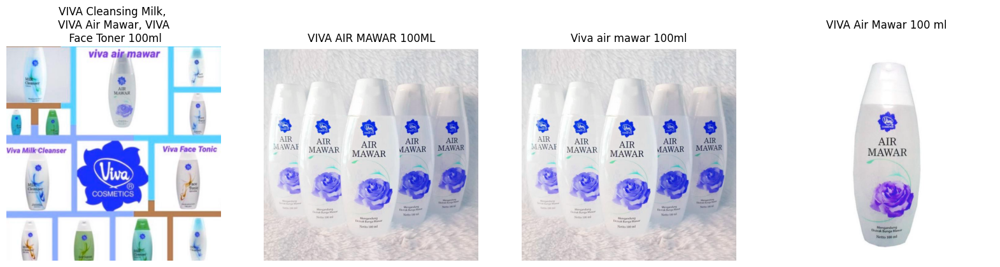

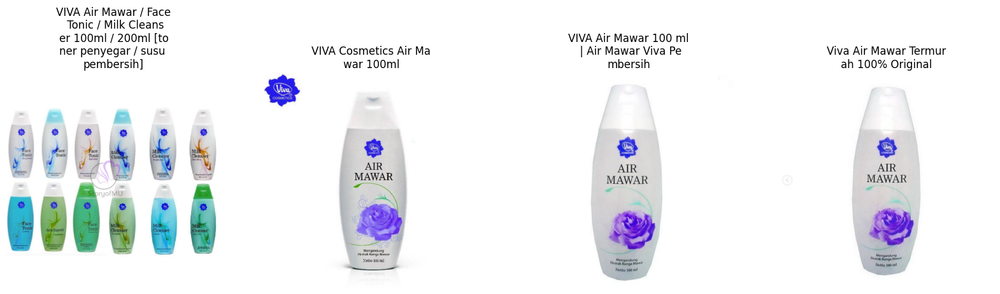

In [ ]:
for k in range(5):
    print('#'*40)
    print('### TOP %i DUPLICATED ITEM:'%(k+1),groups.index[k])
    print('#'*40)
    top = train.loc[train.label_group==groups.index[k]]
    displayDF(top, random=False, ROWS=2, COLS=4)

# Find Similar Titles with RAPIDS!
We will now ignore the ground truth and try to find similar items in train data using only the title's text. First we will extract text embeddings using RAPIDS cuML's TfidfVectorizer. This will turn every title into a one-hot-encoding of the words present. We will then compare one-hot-encodings with RAPIDS cuML KNN to find title's that are similar.

In [ ]:
import cudf, cuml, cupy
from cuml.feature_extraction.text import TfidfVectorizer
from cuml.neighbors import NearestNeighbors
print('RAPIDS',cuml.__version__)

RAPIDS 24.10.00


In [ ]:
# LOAD TRAIN UNTO THE GPU WITH CUDF
train_gf = cudf.read_csv('shopee-product-matching/train.csv')
print('train shape is', train_gf.shape )
train_gf.head()

train shape is (34250, 5)


,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


## Extract Text Embeddings with RAPIDS TfidfVectorizer
TfidfVectorizer returns a cupy sparse matrix. Afterward we convert to a cupy dense matrix and feed that into RAPIDS cuML KNN.

In [ ]:
%%time

model = TfidfVectorizer(stop_words='english', binary=True)
text_embeddings = model.fit_transform(train_gf.title).toarray()   # 34250 rows x 24939 features
print('text embeddings shape is',text_embeddings.shape)

text embeddings shape is (34250, 24939)
CPU times: user 4.79 s, sys: 0 ns, total: 4.79 s
Wall time: 5.19 s


## t-distributed stochastic neighbor embedding (t-SNE) using cuML

In [ ]:
%%time

# cuML TSNE on 130 features
from cuml.manifold import TSNE
tsne    = TSNE(n_components=2, perplexity=50, learning_rate=20)
tsne_2D = tsne.fit_transform(text_embeddings) #skX

[W] [04:17:17.942798] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
CPU times: user 59.4 s, sys: 0 ns, total: 59.4 s
Wall time: 59 s


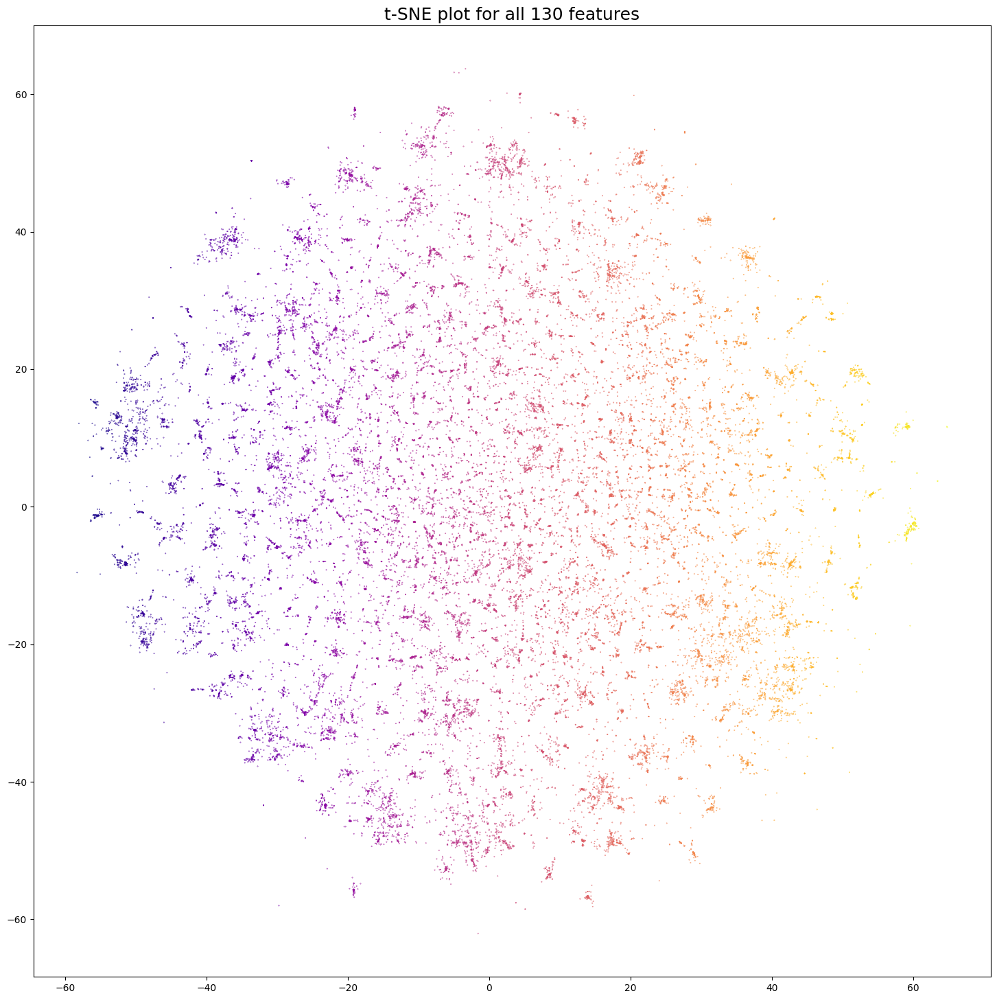

In [ ]:
# graph
x, y = tsne_2D.get().T
fig, ax = plt.subplots(figsize=(18, 18))
ax.scatter(x, y, s=0.1, c=x, cmap=plt.cm.plasma)
ax.set_title('t-SNE plot for all 130 features', fontsize=18)
plt.show();

## Find Similar Titles with RAPIDS KNN
After fitting KNN, we will display some example rows of train and their 10 closest other titles in train (based on word count one-hot-encoding).

In [ ]:
KNN = 50
model = NearestNeighbors(n_neighbors=KNN)
model.fit(text_embeddings)
distances, indices = model.kneighbors(text_embeddings)

In [ ]:
for k in range(5):
    plt.figure(figsize=(20,3))
    plt.plot(np.arange(50),cupy.asnumpy(distances[k,]),'o-')
    plt.title('Text Distance From Train Row %i to Other Train Rows'%k,size=16)
    plt.ylabel('Distance to Train Row %i'%k,size=14)
    plt.xlabel('Index Sorted by Distance to Train Row %i'%k,size=14)
    plt.show()

    print( train_gf.loc[cupy.asnumpy(indices[k,:10]),['title','label_group']] )

# Find Matching Images with RAPIDS!
We will now ignore the ground truth and try to find similar items in train data using only the item's image. First we will extract image embeddings using EffNetB0. We will then compare image embeddings with RAPIDS cuML KNN to find images that are similar.

## Extract Image Embeddings with EffNetB0

In [ ]:
class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, df, img_size=256, batch_size=32, path=BASE):
        self.df = df
        self.img_size = img_size
        self.batch_size = batch_size
        self.path = path
        self.indexes = np.arange( len(self.df) )

    def __len__(self):
        'Denotes the number of batches per epoch'
        ct = len(self.df) // self.batch_size
        ct += int(( (len(self.df)) % self.batch_size)!=0)
        return ct

    def __getitem__(self, index):
        'Generate one batch of data'
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        X = self.__data_generation(indexes)
        return (X, )   # Tensorflow model expects the generator to yield a tuple (inputs, labels) or (inputs,)

    def __data_generation(self, indexes):
        'Generates data containing batch_size samples'
        X = np.zeros((len(indexes),self.img_size,self.img_size,3),dtype='float32')
        df = self.df.iloc[indexes]
        for i,(index,row) in enumerate(df.iterrows()):
            img = cv2.imread(self.path+row.image)
            X[i,] = cv2.resize(img,(self.img_size,self.img_size)) #/128.0 - 1.0
        return X

    """def __data_generation(self, indexes):
        'Generates data containing batch_size samples'
        X = np.zeros((len(indexes), self.img_size, self.img_size, 3), dtype='float32')
        df = self.df.iloc[indexes]
        for i, (index, row) in enumerate(df.iterrows()):
            img = cv2.imread(self.path + row.image)
            img = cv2.resize(img, (self.img_size, self.img_size))  # Resize image
            X[i,] = img.astype('float32') / 255.0  # Normalize to [0, 1]
        return X"""

In [ ]:
import tensorflow as tf
print("GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.sysconfig.get_build_info())

GPUs Available:  1
OrderedDict([('cpu_compiler', '/usr/lib/llvm-18/bin/clang'), ('cuda_compute_capabilities', ['sm_60', 'sm_70', 'sm_80', 'sm_89', 'compute_90']), ('cuda_version', '12.5.1'), ('cudnn_version', '9'), ('is_cuda_build', True), ('is_rocm_build', False), ('is_tensorrt_build', False)])


In [ ]:
# Need higher version of tensorflow (2.16) for the higher version of cudnn (9.3) but requires lower version of cuda (11.9). May need Python 3.9
# will try creating a new conda environment later

In [ ]:
model = EfficientNetB0(weights='imagenet',include_top=False, pooling='avg', input_shape=None)
train_gen = DataGenerator(train, batch_size=128)
image_embeddings = model.predict(train_gen,verbose=1)
print('image embeddings shape is',image_embeddings.shape)

## Find Similar Images with RAPIDS KNN
After fitting KNN, we will display some example rows of train and their 8 closest other images in train (based EffNetB0 image embeddings).

In [ ]:
KNN = 50
model = NearestNeighbors(n_neighbors=KNN)
model.fit(image_embeddings)
distances, indices = model.kneighbors(image_embeddings)

In [ ]:
for k in range(180,190):
    plt.figure(figsize=(20,3))
    plt.plot(np.arange(50),cupy.asnumpy(distances[k,]),'o-')
    plt.title('Image Distance From Train Row %i to Other Train Rows'%k,size=16)
    plt.ylabel('Distance to Train Row %i'%k,size=14)
    plt.xlabel('Index Sorted by Distance to Train Row %i'%k,size=14)
    plt.show()

    cluster = train.loc[cupy.asnumpy(indices[k,:8])]
    displayDF(cluster, random=False, ROWS=2, COLS=4)

# Test Data
The next thing to do is apply the above methods on the test data and create a submission notebook! Have fun!

In [ ]:
test = pd.read_csv('shopee-product-matching/test.csv')
print( test.shape )
test.head()

In [ ]:
sub = pd.read_csv('shopee-product-matching/sample_submission.csv')
print( sub.shape )
sub.head()

## Notes:
Comparison of execution time between sklearn's TfidfVectorizer vs cuml's TfidfVectorizer

In [ ]:
%%time

# Test with sklearn's TfidfVectorizer
import sklearn.feature_extraction.text

# Convert the documents to a TF-IDF matrix
skvectorizer = sklearn.feature_extraction.text.TfidfVectorizer(stop_words='english')
skX = skvectorizer.fit_transform(train_gf.title.to_pandas())

print("TF-IDF Matrix Shape:", skX.shape)  # Output the shape of the matrix

TF-IDF Matrix Shape: (34250, 24939)
CPU times: user 195 ms, sys: 0 ns, total: 195 ms
Wall time: 191 ms


In [ ]:
%%time

# cuML TSNE on 130 features
from cuml.manifold import TSNE
tsne    = TSNE(n_components=2, perplexity=50, learning_rate=20)
tsne_2D = tsne.fit_transform(skX)

[W] [04:31:21.760666] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
CPU times: user 1.7 s, sys: 151 ms, total: 1.85 s
Wall time: 1.99 s


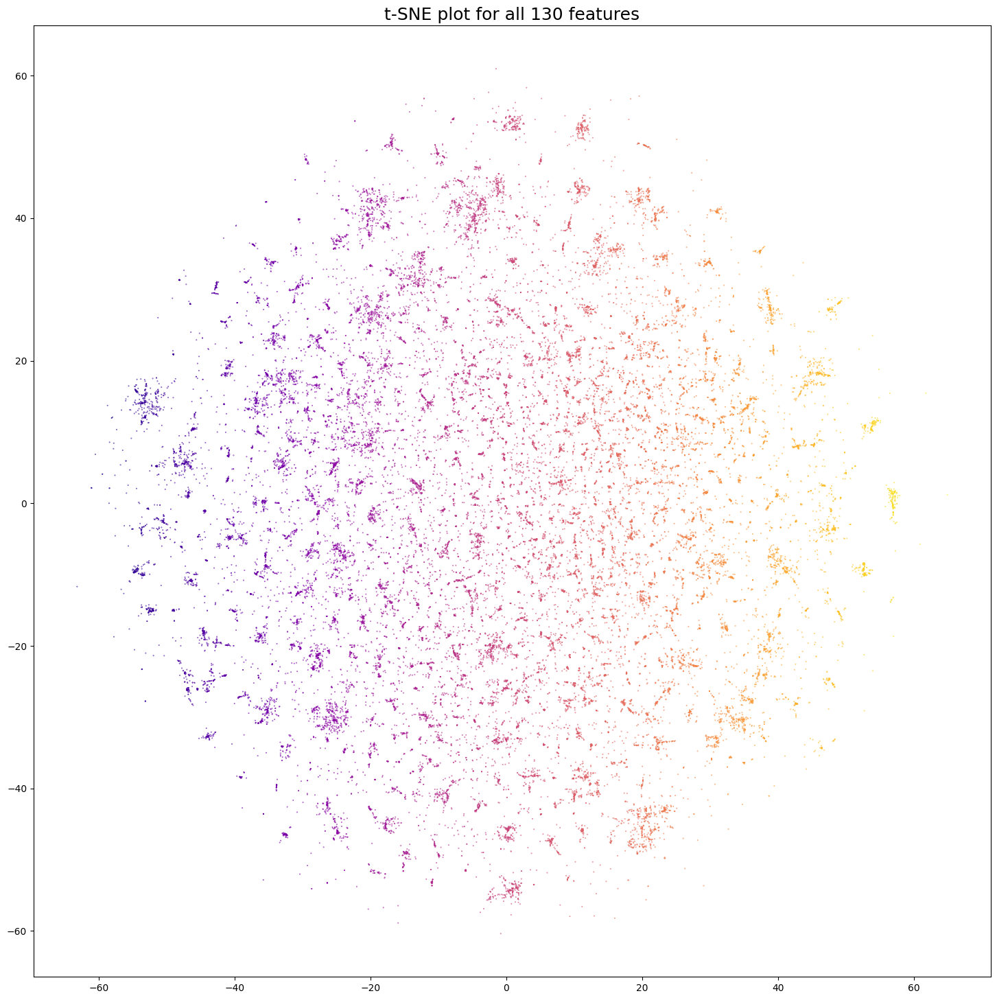

In [ ]:
# graph
x, y = tsne_2D.T   # don't use .get() for numpy array
fig, ax = plt.subplots(figsize=(18, 18))
ax.scatter(x, y, s=0.1, c=x, cmap=plt.cm.plasma)
ax.set_title('t-SNE plot for all 130 features', fontsize=18)
plt.show();

## Observation:
sklearn's TfidfVectorizer is computed much faster than cuml's, likely due to the dataset being small enough that sklearn's computation via direct interaction with the CPU is much more efficient than RAPIDS cuml's computation via fetching/delivering interactions with the GPU.

## Future works:
- Tackle with new conda environment that solves compatibility issues among tensorflow, RAPIDS, and cuda-toolkit
- Additional steps to compare performance between cudf and pandas & cuml vs sklearn
- Etc

### Reference:
https://www.kaggle.com/code/cdeotte/rapids-cuml-tfidfvectorizer-and-knn/notebook

https://www.kaggle.com/code/carlmcbrideellis/jane-street-t-sne-using-rapids-cuml/notebook